In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import pickle

In [ ]:
!pip install tslearn

In [ ]:
!pip install pyts

In [ ]:
from tslearn.metrics import dtw, dtw_path, cdist_dtw, subsequence_cost_matrix

In [ ]:
from tslearn.clustering import TimeSeriesKMeans, silhouette_score
from tslearn.generators import random_walks

In [ ]:
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('png', 'pdf')
plt.rcParams.update({'font.size': 12,
                     'xtick.labelsize' : 12,
                     'ytick.labelsize' : 12,
                     'axes.grid': False})

In [ ]:

y_train = pd.read_fwf("y_train.txt", header = None)[0]
y_test = pd.read_fwf("y_test.txt", header = None)[0]

subject_train = pd.read_csv("subject_train.txt", header = None)[0]
subject_test = pd.read_csv("subject_test.txt", header = None)[0]

body_x = pd.read_fwf("body_acc_x_train.txt", header = None)
body_y = pd.read_fwf("body_acc_y_train.txt", header = None)
body_z = pd.read_fwf("body_acc_z_train.txt", header = None)

acc_x = pd.read_fwf("total_acc_x_train.txt", header = None)
acc_y = pd.read_fwf("total_acc_y_train.txt", header = None)
acc_z = pd.read_fwf("total_acc_z_train.txt", header = None)

gyro_x = pd.read_fwf("body_gyro_x_train.txt", header = None)
gyro_y = pd.read_fwf("body_gyro_y_train.txt", header = None)
gyro_z = pd.read_fwf("body_gyro_z_train.txt", header = None)

body_x_test = pd.read_fwf("body_acc_x_test.txt", header = None)
body_y_test = pd.read_fwf("body_acc_y_test.txt", header = None)
body_z_test = pd.read_fwf("body_acc_z_test.txt", header = None)

acc_x_test = pd.read_fwf("total_acc_x_test.txt", header = None)
acc_y_test = pd.read_fwf("total_acc_y_test.txt", header = None)
acc_z_test = pd.read_fwf("total_acc_z_test.txt", header = None)

gyro_x_test = pd.read_fwf("body_gyro_x_test.txt", header = None)
gyro_y_test = pd.read_fwf("body_gyro_y_test.txt", header = None)
gyro_z_test = pd.read_fwf("body_gyro_z_test.txt", header = None)

In [ ]:
with open("features.txt") as f:
    lines = f.read().splitlines()
    
features = {}
for line in lines:
    idx, name = line.split()
    features[int(idx)-1] = name

In [ ]:
with open('activity_labels.txt') as f:
    lines = f.read().splitlines()

activities = {}
for line in lines:
    label, activity = line.split()
    activities[int(label)] = activity

In [ ]:
y_train_mapped = y_train.map(activities)
y_test_mapped = y_test.map(activities)

# Time series dataframe

Creiamo un dizionario con tutti e 6 i dataframe: body_x, body_y, body_z, gyro_x, gyro_y, gyro_z. Per ognuno di questi dataframe andiamo poi a prenderci solamente le prime 64 colonne (letture). Dobbiamo però considerare che, così facendo, le letture che vanno dalla 64esima alla 127esima colonna dell'ultima riga di ciascun dataframe verrebbero perse. Per tale motivo, prendiamo l'ultima riga per intero. Più precisamente, con le ultime 64 letture dell'ultima riga andiamo a crearci una nuova riga. Alla fine, ciascun dataset non avrà più 7352 righe, bensì 7353.

In [ ]:
dict_dfs = {'body_x': body_x,
            'body_y': body_y,
            'body_z': body_z,
            #'acc_x' : acc_x,
            #'acc_y' : acc_y,
            #'acc_z' : acc_z,
            'gyro_x': gyro_x,
            'gyro_y': gyro_y,
            'gyro_z': gyro_z}

for name_df, df in dict_dfs.items():
    last_row = df.iloc[-1:,64:]
    last_row.columns = np.arange(64) # rename columns of the last raw
    first64 = df.iloc[:,:64]
    dict_dfs[name_df] = pd.concat([first64, last_row], ignore_index=True)
    # aggiungiamo anche le colonne ID soggetto e tipo di attività svolta
    dict_dfs[name_df]['subject'] = subject_train
    dict_dfs[name_df]['activity'] = y_train_mapped
    dict_dfs[name_df].iloc[-1, -2:] = dict_dfs[name_df].iloc[-2, -2:]
    dict_dfs[name_df]['subject'] = dict_dfs[name_df]['subject'].astype(int)

In [ ]:
dict_dfs_test = {'body_x_test': body_x_test,
                 'body_y_test': body_y_test,
                 'body_z_test': body_z_test,
                 #'acc_x_test': acc_x_test,
                 #'acc_y_test': acc_y_test,
                 #'acc_z_test': acc_z_test,
                 'gyro_x_test': gyro_x_test,
                 'gyro_y_test': gyro_y_test,
                 'gyro_z_test': gyro_z_test}

for name_df, df in dict_dfs_test.items():
    last_row = df.iloc[-1:,64:]
    last_row.columns = np.arange(64) # rename columns of the last raw
    first64 = df.iloc[:,:64]
    dict_dfs_test[name_df] = pd.concat([first64, last_row], ignore_index=True)
    # aggiungiamo anche le colonne ID soggetto e tipo di attività svolta
    dict_dfs_test[name_df]['subject'] = subject_test
    dict_dfs_test[name_df]['activity'] = y_train_mapped
    dict_dfs_test[name_df].iloc[-1, -2:] = dict_dfs_test[name_df].iloc[-2, -2:]
    dict_dfs_test[name_df]['subject'] = dict_dfs_test[name_df]['subject'].astype(int)
    
                
#df_ts_test = pd.DataFrame(dict_dfs_ts_test)


#WALKING

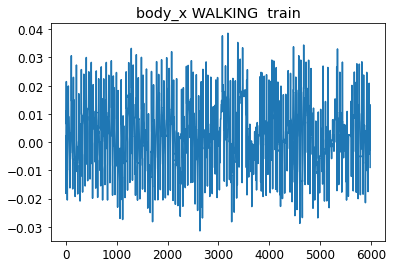

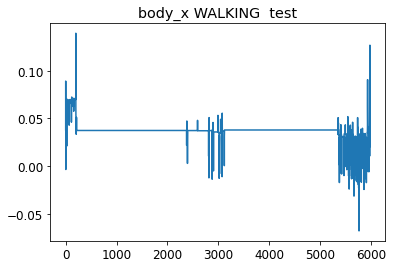

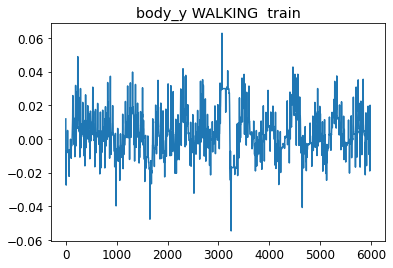

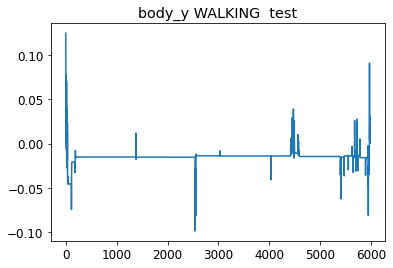

In [ ]:
windows = 100

for name_df,df in dict_dfs.items():
  X_train=[]
  X_test=[]
  temp_train=df
  temp_test=dict_dfs_test[name_df+'_test']

  temp1_train=temp_train.loc[temp_train['activity']=='WALKING']
  temp1_test=temp_test.loc[temp_test['activity']=='WALKING']

  for subject in subject_train.unique():
    temp2=temp1_train.loc[temp1_train['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_train.append(ts)
  
  for subject in subject_test.unique():
    temp2=temp1_test.loc[temp1_test['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_test.append(ts)



  df_X_train = pd.DataFrame(X_train)
  cluster_train=df_X_train.values

  df_X_test = pd.DataFrame(X_test)
  cluster_test=df_X_test.values

  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_train)

  clus_train=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' WALKING '+' train')
  plt.show()


  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_test)

  clus_test=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' WALKING '+' test')

  plt.show()

  temp_dtw=dtw(clus_train,clus_test)
  dtw_array.append(temp_dtw)
print(temp_dtw)

In [ ]:
type(clus_test)

numpy.ndarray

#WALKING UPSTAIRS

In [ ]:
act='WALKING_UPSTAIRS'
windows = 100
dtw_array=[]
for name_df,df in dict_dfs.items():
  X_train=[]
  X_test=[]
  temp_train=df
  temp_test=dict_dfs_test[name_df+'_test']

  temp1_train=temp_train.loc[temp_train['activity']==act]
  temp1_test=temp_test.loc[temp_test['activity']==act]

  for subject in subject_train.unique():
    temp2=temp1_train.loc[temp1_train['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_train.append(ts)
  
  for subject in subject_test.unique():
    temp2=temp1_test.loc[temp1_test['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_test.append(ts)



  df_X_train = pd.DataFrame(X_train)
  cluster_train=df_X_train.values

  df_X_test = pd.DataFrame(X_test)
  cluster_test=df_X_test.values

  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_train)

  clus_train=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' '+act+' train')
  plt.show()


  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_test)

  clus_test=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' '+act+' test')

  plt.show()

  temp_dtw=dtw(clus_train,clus_test)
  dtw_array.append(temp_dtw)
print(temp_dtw)

#WALKING DOWNSTAIRS

In [ ]:
act='WALKING_DOWNSTAIRS'
windows = 100
dtw_array=[]
for name_df,df in dict_dfs.items():
  X_train=[]
  X_test=[]
  temp_train=df
  temp_test=dict_dfs_test[name_df+'_test']

  temp1_train=temp_train.loc[temp_train['activity']==act]
  temp1_test=temp_test.loc[temp_test['activity']==act]

  for subject in subject_train.unique():
    temp2=temp1_train.loc[temp1_train['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_train.append(ts)
  
  for subject in subject_test.unique():
    temp2=temp1_test.loc[temp1_test['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_test.append(ts)



  df_X_train = pd.DataFrame(X_train)
  cluster_train=df_X_train.values

  df_X_test = pd.DataFrame(X_test)
  cluster_test=df_X_test.values

  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_train)

  clus_train=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' '+act+' train')
  plt.show()


  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_test)

  clus_test=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' '+act+' test')

  plt.show()

  temp_dtw=dtw(clus_train,clus_test)
  dtw_array.append(temp_dtw)
print(temp_dtw)

#SITTING

In [ ]:
act='SITTING'
windows = 100
dtw_array=[]
for name_df,df in dict_dfs.items():
  X_train=[]
  X_test=[]
  temp_train=df
  temp_test=dict_dfs_test[name_df+'_test']

  temp1_train=temp_train.loc[temp_train['activity']==act]
  temp1_test=temp_test.loc[temp_test['activity']==act]

  for subject in subject_train.unique():
    temp2=temp1_train.loc[temp1_train['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_train.append(ts)
  
  for subject in subject_test.unique():
    temp2=temp1_test.loc[temp1_test['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_test.append(ts)



  df_X_train = pd.DataFrame(X_train)
  cluster_train=df_X_train.values

  df_X_test = pd.DataFrame(X_test)
  cluster_test=df_X_test.values

  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_train)

  clus_train=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' '+act+' train')
  plt.show()


  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_test)

  clus_test=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' '+act+' test')

  plt.show()

  temp_dtw=dtw(clus_train,clus_test)
  dtw_array.append(temp_dtw)
print(temp_dtw)

#STANDING

In [ ]:
act='STANDING'
windows = 100
dtw_array=[]
for name_df,df in dict_dfs.items():
  X_train=[]
  X_test=[]
  temp_train=df
  temp_test=dict_dfs_test[name_df+'_test']

  temp1_train=temp_train.loc[temp_train['activity']==act]
  temp1_test=temp_test.loc[temp_test['activity']==act]

  for subject in subject_train.unique():
    temp2=temp1_train.loc[temp1_train['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_train.append(ts)
  
  for subject in subject_test.unique():
    temp2=temp1_test.loc[temp1_test['subject']==subject]
    temp2=temp2.iloc[:,:-2]
    ts=temp2.values.ravel()
    ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
    ts=np.array(ts)
    X_test.append(ts)



  df_X_train = pd.DataFrame(X_train)
  cluster_train=df_X_train.values

  df_X_test = pd.DataFrame(X_test)
  cluster_test=df_X_test.values

  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_train)

  clus_train=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' '+act+' train')
  plt.show()


  km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
  km_dtw.fit(cluster_test)

  clus_test=np.squeeze(km_dtw.cluster_centers_)

  plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
  plt.title(name_df+' '+act+' test')

  plt.show()

  temp_dtw=dtw(clus_train,clus_test)
  dtw_array.append(temp_dtw)
print(temp_dtw)

##Body x

###WALKING

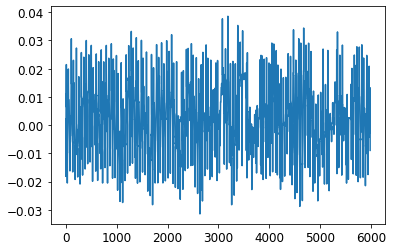

In [ ]:
X_bodyx_walking=[]
windows = 100
temp=dict_dfs['body_x']
temp1=temp.loc[temp['activity']=='WALKING']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
  ts=np.array(ts)
  X_bodyx_walking.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
#X_bodyx=np.array(X_bodyx_standing)



df_bodyx_walking = pd.DataFrame(X_bodyx_walking)
cluster_bodyx_walking=df_bodyx_walking.values

#plt.plot(cluster_bodyx_walking.T)
#plt.ylim(-0.5,0.5)

km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
km_dtw.fit(cluster_bodyx_walking)

clus_bodyx_walking=np.squeeze(km_dtw.cluster_centers_)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

In [ ]:
np.squeeze(km_dtw.cluster_centers_)

array([ 0.00211379, -0.00653898, -0.01816946, ..., -0.00269216,
        0.0132249 , -0.00896017])

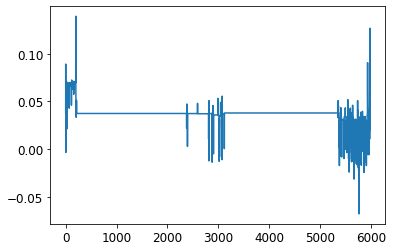

In [ ]:
X_bodyx_walking=[]
windows = 100
temp=dict_dfs_test['body_x_test']
temp1=temp.loc[temp['activity']=='WALKING']
#X_temp=[]
for subject in subject_test.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
  ts=np.array(ts)
  X_bodyx_walking.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
#X_bodyx=np.array(X_bodyx_standing)



df_bodyx_walking = pd.DataFrame(X_bodyx_walking)
cluster_bodyx_walking=df_bodyx_walking.values

#plt.plot(cluster_bodyx_walking.T)
#plt.ylim(-0.5,0.5)

km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
km_dtw.fit(cluster_bodyx_walking)

clus_bodyx_walking_test=np.squeeze(km_dtw.cluster_centers_)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

In [ ]:
dtw(clus_bodyx_walking,clus_bodyx_walking_test)

TypeError: ignored

###WALKING UPSTAIRS

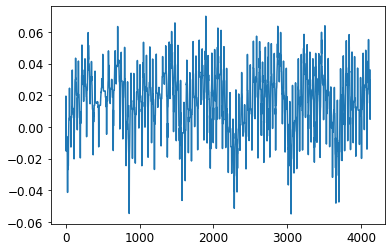

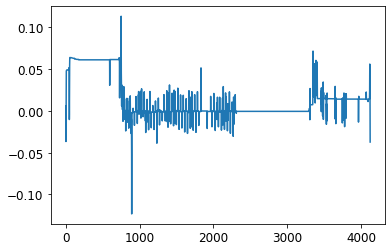

0.5591806763999774

In [ ]:
X=[]
windows = 100
temp=dict_dfs['body_x']
temp1=temp.loc[temp['activity']=='WALKING_UPSTAIRS']

for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
  ts=np.array(ts)
  X.append(ts)



df_X = pd.DataFrame(X)
cluster_train=df_X.values

km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
km_dtw.fit(cluster_train)

clus_train=np.squeeze(km_dtw.cluster_centers_)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()



X=[]
windows = 100
temp=dict_dfs_test['body_x_test']
temp1=temp.loc[temp['activity']=='WALKING_UPSTAIRS']

for subject in subject_test.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  ts=pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]
  ts=np.array(ts)
  X.append(ts)



df_X = pd.DataFrame(X)
cluster_test=df_X.values

km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=1, random_state=0)
km_dtw.fit(cluster_test)

clus_test=np.squeeze(km_dtw.cluster_centers_)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

dtw(clus_train,clus_test)

###WALKING DOWNSTAIRS

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_x']
temp1=temp.loc[temp['activity']=='WALKING_DOWNSTAIRS']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

###SITTING

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_x']
temp1=temp.loc[temp['activity']=='SITTING']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

### Standing

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_x']
#for activity in [activities[k] for k in range(1,6)]:
temp1=temp.loc[temp['activity']=='STANDING']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


In [ ]:
df_ts_prova = pd.DataFrame(X_bodyx_standing)

In [ ]:
X_cluster_prova=df_ts_prova.values

In [ ]:
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

TimeSeriesKMeans(max_iter=5, metric='dtw', n_clusters=1, random_state=0)

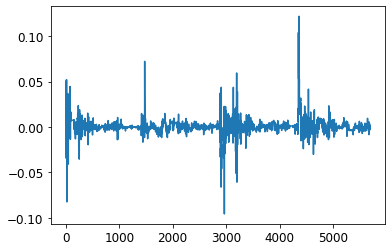

In [ ]:
plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

##BODY Y

###WALKING

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_y']
temp1=temp.loc[temp['activity']=='WALKING']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

###WALKING UPSTAIRS

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_y']
temp1=temp.loc[temp['activity']=='WALKING_UPSTAIRS']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

###WALKING DOWNSTAIRS

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_y']
temp1=temp.loc[temp['activity']=='WALKING_DOWNSTAIRS']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

###SITTING

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_y']
temp1=temp.loc[temp['activity']=='SITTING']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

###STANDING

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_y']
temp1=temp.loc[temp['activity']=='STANDING']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

##BODY Z

###WALKING

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_z']
temp1=temp.loc[temp['activity']=='WALKING']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

###WALKING UPSTAIRS

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_z']
temp1=temp.loc[temp['activity']=='WALKING_UPSTAIRS']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

###WALKING DOWNSTAIRS

In [ ]:
X_bodyx_standing=[]
temp=dict_dfs['body_z']
temp1=temp.loc[temp['activity']=='WALKING_DOWNSTAIRS']
#X_temp=[]
for subject in subject_train.unique():
  temp2=temp1.loc[temp1['subject']==subject]
  temp2=temp2.iloc[:,:-2]
  ts=temp2.values.ravel()
  X_bodyx_standing.append(ts)
#X_temp=np.array(X_temp)
#X_bodyx.append(X_temp)
X_bodyx=np.array(X_bodyx_standing)

df_ts_prova = pd.DataFrame(X_bodyx_standing)
X_cluster_prova=df_ts_prova.values
km_dtw = TimeSeriesKMeans(n_clusters=1, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_cluster_prova)

plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

###SITTING

#ALTRO

Partendo dai dataframe appena definiti, creiamo un dataset di time series come di seguito mostrato. Ciascuno dei 21 soggetti nel train set svolge 5 attività differenti, quindi per ogni colonna avremo $21\cdot5=105$ time series.

| index | body_x | body_y | body_z | gyro_x | gyro_y | gyro_z | subject | activity |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 0 | TS | TS | TS | TS | TS | TS | 1 | 'WALKING' |
| 1 | TS | TS | TS | TS | TS | TS | 1 | 'WALKING_UPSTAIRS' |
| ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 4 | TS | TS | TS | TS | TS | TS | 1 | 'STANDING' |
| 5 | TS | TS | TS | TS | TS | TS | 2 | 'WALKING' |
| 6 | TS | TS | TS | TS | TS | TS | 2 | 'WALKING_UPSTAIRS' |
| ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 9 | TS | TS | TS | TS | TS | TS | 2 | 'STANDING' |
| ... | ... | ... | ... | ... | ... | ... | ... | ... |

Per costruire questa tabella, creiamo prima il dizionario associato

In [ ]:
dict_dfs_ts = {name_df: [] for name_df in dict_dfs}
dict_dfs_ts['subject'] = []
dict_dfs_ts['activity'] = []
for name_df, df in dict_dfs.items():
    for subject in subject_train.unique():
        for activity in [activities[k] for k in range(1,6)]: 
            # non consideriamo LAYING
            mask = (df['activity'] == activity) & (df['subject'] == subject)
            time_series = df.iloc[mask.values, :-2].values.ravel()
            dict_dfs_ts[name_df].append(time_series)
            # all'ultima iterazione del lool più esterno ci salviamo anche
            # gli ID dei soggetti e le attività nell'ordine di comparizione
            if name_df == 'gyro_z':
                dict_dfs_ts['subject'].append(subject) 
                dict_dfs_ts['activity'].append(activity)

df_ts = pd.DataFrame(dict_dfs_ts)

In [ ]:
df_ts = pd.DataFrame(dict_dfs_ts)

In [ ]:
# with open('df_ts.pkl', 'wb') as f:
#         pickle.dump(df_ts, f)

In [ ]:
# with open('df_ts.pkl', 'rb') as f:
#     df_ts = pickle.load(f)

Facciamo la stessa cosa per il test set

In [ ]:
dict_dfs_test = {'body_x': body_x_test,
                 'body_y': body_y_test,
                 'body_z': body_z_test,
                 'acc_x': acc_x_test,
                 'acc_y': acc_y_test,
                 'acc_z': acc_z_test,
                 'gyro_x': gyro_x_test,
                 'gyro_y': gyro_y_test,
                 'gyro_z': gyro_z_test}

for name_df, df in dict_dfs_test.items():
    last_row = df.iloc[-1:,64:]
    last_row.columns = np.arange(64) # rename columns of the last raw
    first64 = df.iloc[:,:64]
    dict_dfs_test[name_df] = pd.concat([first64, last_row], ignore_index=True)
    # aggiungiamo anche le colonne ID soggetto e tipo di attività svolta
    dict_dfs_test[name_df]['subject'] = subject_test
    dict_dfs_test[name_df]['activity'] = y_train_mapped
    dict_dfs_test[name_df].iloc[-1, -2:] = dict_dfs_test[name_df].iloc[-2, -2:]
    dict_dfs_test[name_df]['subject'] = dict_dfs_test[name_df]['subject'].astype(int)
    
dict_dfs_ts_test = {name_df: [] for name_df in dict_dfs_test}
dict_dfs_ts_test['subject'] = []
dict_dfs_ts_test['activity'] = []
for name_df, df in dict_dfs_test.items():
    for subject in subject_test.unique():
        for activity in [activities[k] for k in range(1,6)]: 
            # non consideriamo LAYING
            mask = (df['activity'] == activity) & (df['subject'] == subject)
            time_series = df.iloc[mask.values, :-2].values.ravel()
            dict_dfs_ts_test[name_df].append(time_series)
            # all'ultima iterazione del lool più esterno ci salviamo anche
            # gli ID dei soggetti e le attività nell'ordine di comparizione
            if name_df == 'gyro_z':
                dict_dfs_ts_test['subject'].append(subject) 
                dict_dfs_ts_test['activity'].append(activity)
                
df_ts_test = pd.DataFrame(dict_dfs_ts_test)
print(df_ts_test.shape)
df_ts_test

(45, 11)


,body_x,body_y,body_z,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,subject,activity
0,"[0.01320046, 0.01682231, 0.01730045, 0.0175455...","[0.001973605, 0.002142463, 0.0006273488, -0.00...","[-0.005482074, -0.00308659, -0.006719487, -0.0...","[-0.03671591, -0.03289987, -0.03222066, -0.031...","[0.7853775, 0.7855396, 0.7840188, 0.7807139, 0...","[0.6194532, 0.6218721, 0.6182589, 0.6147253, 0...","[0.005753219, -0.0001820775, 0.001591174, 0.00...","[-0.002114665, 0.003559954, -0.004588763, -0.0...","[0.005463871, 0.00310208, 0.0120293, 0.0189687...",2,WALKING
1,"[0.2355948, 0.2466111, 0.3320341, 0.4892892, 0...","[0.0639848, 0.1778715, 0.2819124, 0.1089424, -...","[-0.08134841, -0.2149337, -0.4103081, -0.50053...","[1.125342, 1.13666, 1.222406, 1.380021, 1.3698...","[-0.1584652, -0.04182383, 0.06502403, -0.10508...","[-0.5504819, -0.6840843, -0.8794959, -0.969796...","[-0.5387907, -0.653328, -0.8343902, -0.9199241...","[-0.1659502, -0.3089407, -0.3500776, -0.149157...","[0.3151212, 0.270872, 0.2754882, 0.3155492, 0....",2,WALKING_UPSTAIRS
2,"[-0.3647585, -0.2144658, -0.08926171, -0.05636...","[0.09769928, 0.1046928, 0.1248889, 0.09018532,...","[0.1576034, 0.1082334, -0.02039238, -0.1408169...","[0.5775302, 0.7277453, 0.8527918, 0.8854451, 0...","[-0.2005192, -0.1940281, -0.1742644, -0.209328...","[-0.1245679, -0.1739443, -0.3025582, -0.422952...","[0.9628825, 1.160488, 1.114248, 1.106795, 1.17...","[-0.2683167, -0.132044, -0.2509737, -0.1331634...","[0.3621032, 0.3398063, 0.3895613, 0.3614678, 0...",2,WALKING_DOWNSTAIRS
3,"[-0.0002071833, -0.001206737, -0.003566287, -0...","[-0.006730327, -0.007660402, -0.007356134, -0....","[-0.01199027, -0.009782071, -0.01030756, -0.00...","[0.9628108, 0.9617791, 0.9593863, 0.9601432, 0...","[-0.4051594, -0.4062863, -0.4061789, -0.411074...","[0.04713442, 0.04908692, 0.04830297, 0.0494529...","[-0.01109365, -0.01698659, -0.01545217, -0.008...","[0.0008346684, -0.0005569567, -0.003684011, -0...","[0.01736456, 0.01546254, 0.01222174, 0.0079424...",2,SITTING
4,"[0.01165315, 0.01310909, 0.01126885, 0.0278307...","[-0.02939904, -0.03972867, -0.05240586, -0.052...","[0.1068262, 0.1524549, 0.2168462, 0.2025812, 0...","[1.041216, 1.041803, 1.039086, 1.054768, 1.028...","[-0.2697959, -0.280025, -0.2926631, -0.2923837...","[0.02377977, 0.07629271, 0.1474754, 0.1399061,...","[0.4374637, 0.4682641, 0.4982574, 0.4793957, 0...","[0.5313492, 0.7210685, 0.5203284, 0.3726252, 0...","[0.1365279, 0.09762239, 0.08355578, 0.02286101...",2,STANDING
5,"[-0.2959089, -0.3019473, -0.2747423, -0.133472...","[-0.04083863, -0.06869917, -0.06110585, -0.006...","[-0.03907299, -0.01896556, -0.01816537, 0.0433...","[0.7225615, 0.7166104, 0.7437876, 0.8849088, 1...","[-0.101773, -0.1300511, -0.1228895, -0.0685586...","[0.1429914, 0.1630732, 0.1638477, 0.225363, 0....","[-0.7091551, -0.6308298, -0.6182338, -0.638109...","[-0.04852962, -0.04435917, -0.1141435, -0.1184...","[-0.3740465, -0.2764384, -0.2492035, -0.287109...",4,WALKING
6,"[-0.03333633, -0.0278014, -0.03130994, -0.0323...","[-0.005487181, -0.01608266, -0.01310954, -0.01...","[0.1577464, 0.1446182, 0.1367732, 0.1425561, 0...","[0.9937554, 0.9986123, 0.9944175, 0.9926805, 0...","[-0.02417739, -0.03343222, -0.02919612, -0.032...","[0.2420851, 0.2341934, 0.2315479, 0.2424893, 0...","[0.3123978, 0.2893629, 0.2172125, 0.1820482, 0...","[-0.07694187, 0.02858839, 0.1431223, 0.1918901...","[0.09411999, 0.1012118, 0.09652262, 0.03523908...",4,WALKING_UPSTAIRS
7,"[0.06131741, -0.03474145, -0.004498172, -0.066...","[0.1481802, 0.1777282, 0.1631908, 0.1945173, 0...","[0.2305937, 0.2443892, 0.2443483, 0.295758, 0....","[1.083448, 0.9887566, 1.020304, 0.9594775, 0.8...","[-0.1129645, -0.07814929, -0.08739676, -0.0507...","[0.0741953, 0.08736927, 0.08693697, 0.1381826,...","[0.2680972, 0.2777525, 0.3003549, 0.2494988, 0...","[0.5342797, 0.5550544, 0.5073191, 0.396355, 0....","[0.2333362, 0.1199425, -0.06049969, -0.0538872...",4,WALKING_DOWNSTAIRS
8,"[2.888947e-05, 0.000308628, 0.00281968

In [ ]:
# with open('df_ts_test.pkl', 'wb') as f:
#         pickle.dump(df_ts_test, f)

Proviamo a plottare tutte le TS del record 0 (soggetto 1, attività `WALKING`))

In [ ]:
 df_ts.columns

Index(['body_x', 'body_y', 'body_z', 'acc_x', 'acc_y', 'acc_z', 'gyro_x',
       'gyro_y', 'gyro_z', 'subject', 'activity'],
      dtype='object')

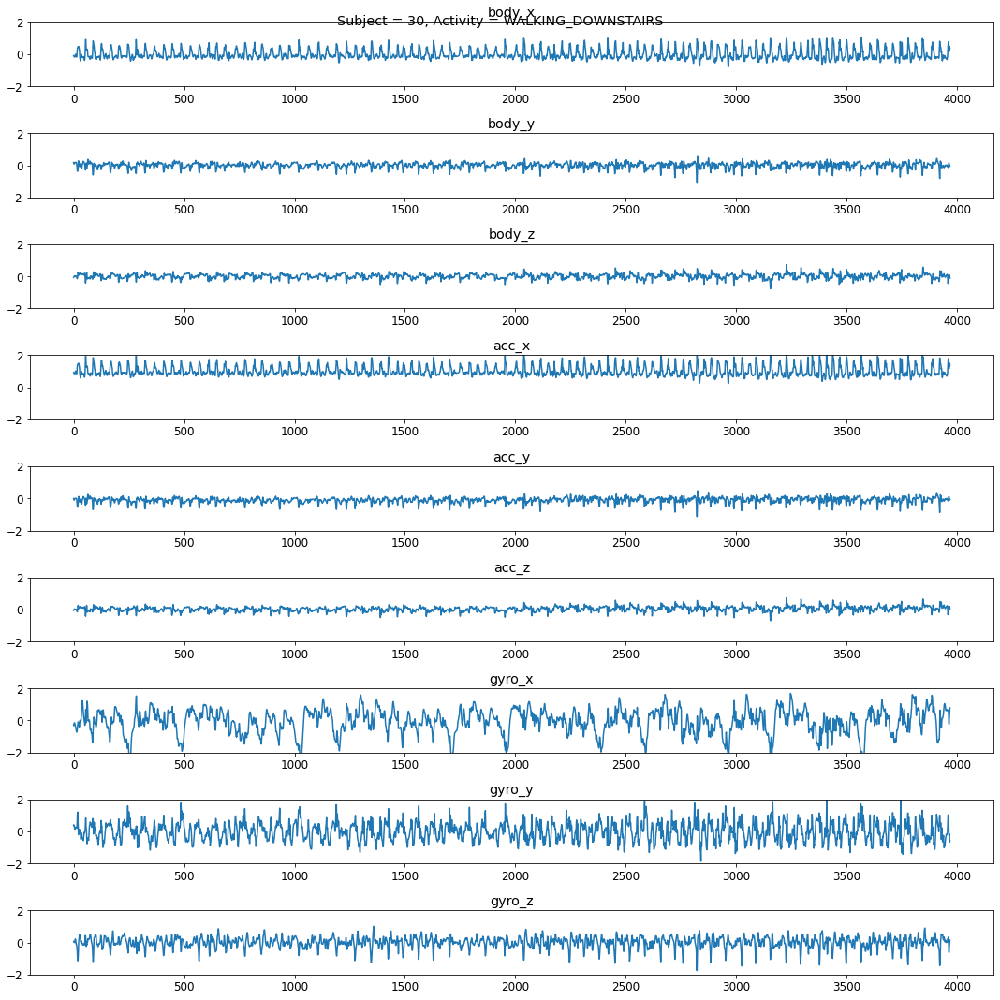

In [ ]:
plt.figure(figsize=(15,15), tight_layout=True)
record_idx = 102
subj_id, act = df_ts.iloc[record_idx, -2:].values
plt.suptitle(f'Subject = {subj_id}, Activity = {act}\n')
for i, TS in enumerate(df_ts.iloc[record_idx, :-2], 1):
    plt.subplot(9,1,i)
    plt.plot(TS)
    title = df_ts.columns[i-1]
    plt.title(title)
    plt.ylim(-2,2)
plt.show()

In [ ]:
# test set 

# plt.figure(figsize=(15,15), tight_layout=True)
# for i, TS in enumerate(df_ts.iloc[0, :-2], 1):
#     plt.subplot(6,1,i)
#     plt.plot(TS)
#     title = df_ts.columns[i-1]
#     plt.title(title)
#     plt.ylim(-2,2)
# plt.show()

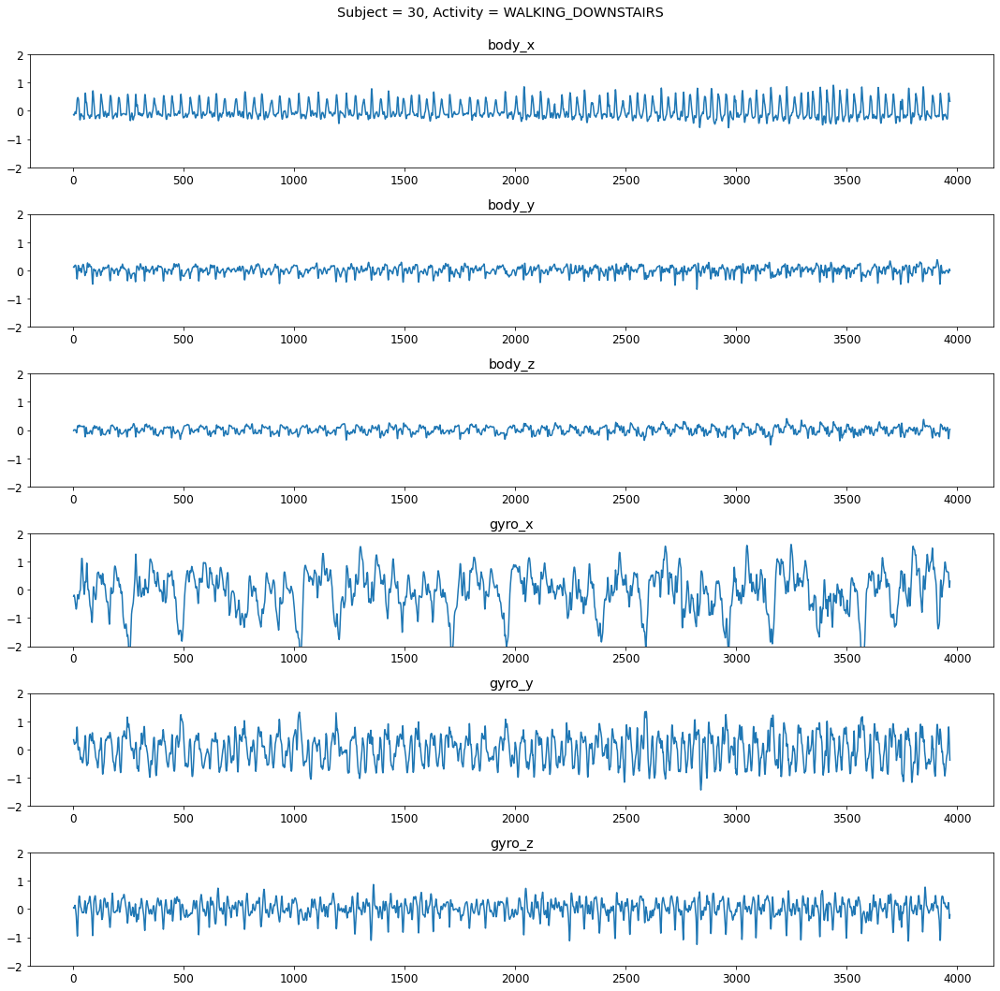

In [ ]:
# media mobile 

plt.figure(figsize=(15,15), tight_layout=True)
window = 5
record_idx = 102
subj_id, act = df_ts.iloc[record_idx, -2:].values
plt.suptitle(f'Subject = {subj_id}, Activity = {act}\n')
for i, TS in enumerate(df_ts.iloc[record_idx, :-2], 1):
    plt.subplot(6,1,i)
    plt.plot(pd.Series(TS).rolling(window).mean()[window-1:])
    title = df_ts.columns[i-1]
    plt.title(title)
    plt.ylim(-2,2)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


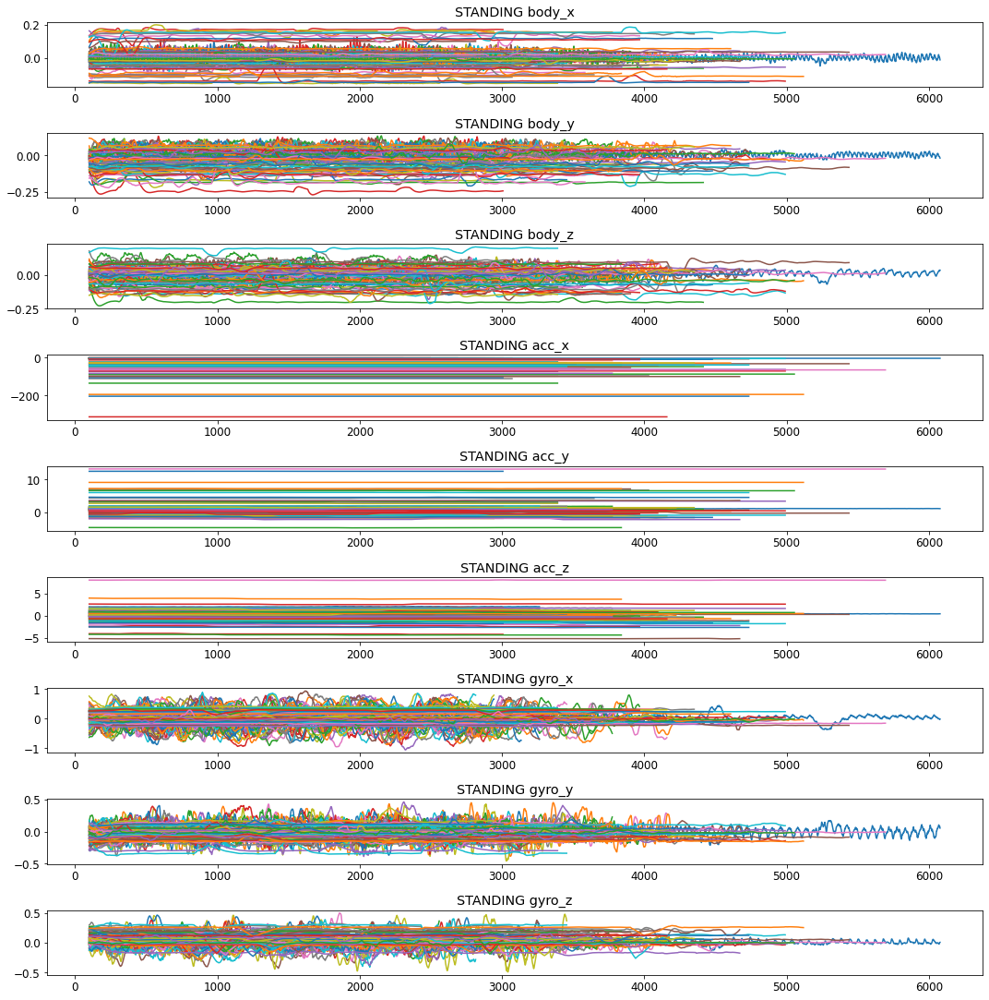

In [ ]:
plt.figure(figsize=(15,50), tight_layout=True)
windows = 100
for act in [activities[k] for k in range(1,6)]:
    mask = df_ts['activity'] == act
    for i, col in enumerate(df_ts.columns[:-2], 1):
        plt.subplot(30,1,i)
        plt.title(act + ' ' + col)
        for ts in df_ts.loc[mask, col].values:        
            #new_ts= ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:]   
            plt.plot(pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:])
        #plt.ylim(-2,2)
plt.show()

In [ ]:
mask = df_ts['activity'] == 'WALKING'
ts_body_x = df_ts.loc[mask,'body_x'].values

In [ ]:
from itertools import combinations
from tslearn.metrics import dtw, dtw_path, cdist_dtw, subsequence_cost_matrix

In [ ]:
len(list(combinations(ts_body_x, 2)))

210

In [ ]:
summation = 0
for ts1, ts2 in combinations(ts_body_x, 2):
    dtw_dist = dtw(ts1, ts2)
    summation += dtw_dist
summation/210

6.0943825218637295

---

#Classic Time Series

In [ ]:
file = [body_x, body_y, body_z, gyro_x, gyro_y, gyro_z]
X_train = list()
for df in file:
    X_train.append(df.values[:, :, np.newaxis])
X_train = np.concatenate(X_train, axis=2)

In [ ]:
X_train = np.array(X_train)

In [ ]:
X_train.shape

(7352, 128, 6)

In [ ]:
pd.DataFrame(X_train[1])

,0,1,2,3,4,5
0,0.001094,-0.004688,-0.026860,0.017111,0.006123,0.012268
1,0.004550,-0.007488,-0.025098,0.024179,0.009710,0.016150
2,0.002879,-0.008430,-0.025975,0.030229,0.010322,0.015895
3,0.002247,-0.007258,-0.026193,0.032029,0.013416,0.012671
4,0.003305,-0.004191,-0.025841,0.031266,0.016858,0.008774
...,...,...,...,...,...,...
123,-0.000736,-0.003574,0.001458,-0.026172,-0.010630,0.018070
124,-0.003767,-0.008672,0.005746,-0.026406,-0.008098,0.014628
125,-0.004646,-0.005480,-0.000300,-0.034741,-0.008695,0.005045
126,-0.002941,-0.002987,-0.004886,-0.037973,-0.011652,-0.004424


In [ ]:
from pyts.classification import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [ ]:
X_train.shape

(7352, 128, 6)

In [ ]:
y_train

0       5
1       5
2       5
3       5
4       5
       ..
7347    2
7348    2
7349    2
7350    2
7351    2
Name: 0, Length: 7352, dtype: int64

In [ ]:
body_x

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,0.000181,0.010139,0.009276,0.005066,0.010810,0.004045,0.004757,0.006214,0.003307,0.007572,...,0.001412,-0.001509,0.000060,0.000435,-0.000819,0.000228,-0.000300,-0.001147,-0.000222,0.001576
1,0.001094,0.004550,0.002879,0.002247,0.003305,0.002416,0.001619,0.000981,0.000009,-0.000363,...,-0.000104,-0.000141,0.001333,0.001541,0.001077,-0.000736,-0.003767,-0.004646,-0.002941,-0.001599
2,0.003531,0.002285,-0.000420,-0.003738,-0.006706,-0.003148,0.000733,0.000668,0.002162,-0.000946,...,0.000661,0.001853,-0.000268,-0.000394,-0.000279,-0.000316,0.000144,0.001246,0.003117,0.002178
3,-0.001772,-0.001311,0.000388,0.000408,-0.000355,0.000998,0.001109,-0.003149,-0.008882,-0.010483,...,0.000458,0.002103,0.001358,0.000820,-0.000212,-0.001915,-0.001631,-0.000867,-0.001172,-0.000028
4,0.000087,-0.000272,0.001022,0.003126,0.002284,0.000885,0.001933,0.002270,0.002247,0.002175,...,0.002529,0.003518,-0.000248,-0.002761,0.000252,0.003752,0.001626,-0.000698,-0.001223,-0.003328
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.388873,0.618763,0.774067,0.586568,0.217007,-0.027330,-0.171294,-0.218988,-0.137680,0.033094,...,-0.227949,-0.247119,-0.227710,-0.210942,-0.179295,-0.142085,-0.131831,-0.154000,-0.176886,-0.211068
7348,0.711864,0.709237,0.321368,-0.028921,-0.208107,-0.192802,-0.066754,-0.042285,0.058089,0.106855,...,-0.311864,-0.316281,-0.274100,-0.326159,-0.379539,-0.382544,-0.371156,-0.295357,-0.203831,-0.124548
7349,-0.226717,-0.177817,-0.150869,-0.132237,-0.068338,0.007874,0.096481,0.205834,0.441342,0.662930,...,-0.177051,-0.248426,-0.313892,-0.367070,-0.395135,-0.347338,-0.319902,-0.294935,-0.243403,-0.215215
7350,-0.064806,-0.079933,-0.068350,-0.038477,-0.028679,0.018335,0.077571,0.253580,0.507805,0.583999,...,-0.240819,-0.330930,-0.396854,-0.413906,-0.379085,-0.356609,-0.317618,-0.315016,-0.330737,-0.272348


In [ ]:
dict_dfs['body_x'].values[:,:-2].shape

(7353, 64)

#Approximation

In [ ]:
from pyts.approximation import DiscreteFourierTransform

#Clustering

In [ ]:
!pip install tslearn

     |████████████████████████████████| 793 kB 5.3 MB/s 


In [ ]:
from tslearn.clustering import TimeSeriesKMeans, silhouette_score
from tslearn.generators import random_walks

In [ ]:
df_train=dict_dfs['body_x']

In [ ]:
df_train = df_train.iloc[:, :-2]
X_train_64=df_train.values

In [ ]:
X_train_64.shape

(7353, 64)

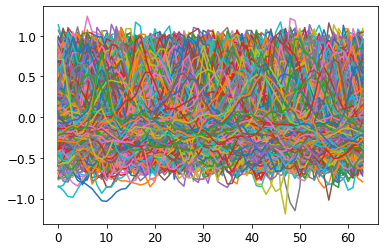

In [ ]:
plt.plot(X_train_64.T)
plt.show()

In [ ]:
km = TimeSeriesKMeans(n_clusters=9, metric="euclidean", max_iter=5, random_state=0)
km.fit(X_train_64)

TimeSeriesKMeans(max_iter=5, n_clusters=9, random_state=0)

In [ ]:
km.cluster_centers_.shape

(9, 64, 1)

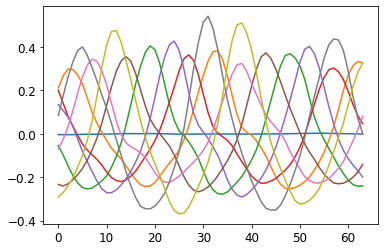

In [ ]:
plt.plot(np.squeeze(km.cluster_centers_).T)
plt.show()

In [ ]:
sil_array=[]

In [ ]:
for i in range(3,100):
  km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=5, random_state=0)
  km.fit(X_train_64)
  labels=km.labels_
  sil=silhouette_score(X_train_64, labels, metric="euclidean")  # doctest: +ELLIPSIS
  sil_array.append(sil)
  print(i,sil)

3 0.44588635337023846
4 0.4678917730399528
5 0.48267026052123907
6 0.49178003670682885
7 0.49129526635793247
8 0.49542717054839036
9 0.4973377290108967
10 0.49921138082430827
11 0.5000067824266371
12 0.5021163679623712
13 0.5035244591344666
14 0.5057498925480743
15 0.5082353857192308
16 0.5114747615910824
17 0.5130899730812437
18 0.514097371552473
19 0.5151229136736996
20 0.5156092823836729
21 0.5131817075670246
22 0.5128943376693094
23 0.5143760314973477
24 0.5157816471952378
25 0.5165444610194607
26 0.5184102462197671
27 0.5189639225568042
28 0.5200769127764252
29 0.5217772340002492
30 0.5232448394764868
31 0.5246715294495452
32 0.5259837930595586
33 0.52623226764367
34 0.526403687302538
35 0.5267451470980856
36 0.5269711739742816
37 0.5269978631581765
38 0.5272183808881226
39 0.5272235839638634
40 0.5279363309049913
41 0.5282691120238705
42 0.5258859610032897
43 0.5259301082044426
44 0.5264948627571623
45 0.5257372604323952
46 0.5262386271437737
47 0.52627620070463
48 0.526427541387

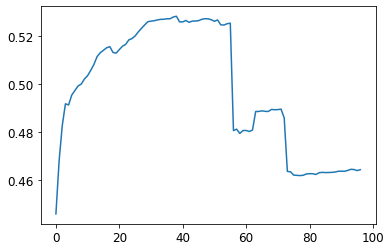

In [ ]:
plt.plot(sil_array)

In [ ]:
km_dtw = TimeSeriesKMeans(n_clusters=6, metric="dtw", max_iter=5, random_state=0)
km_dtw.fit(X_train_64)

In [ ]:
labels=km_dtw.labels_
print(silhouette_score(X_train_64, labels, metric="dtw")) 

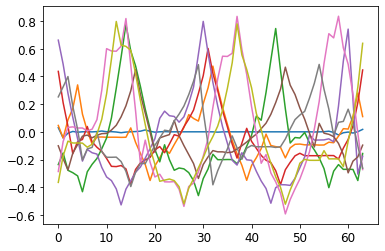

In [ ]:
plt.plot(np.squeeze(km_dtw.cluster_centers_).T)
plt.show()

In [ ]:
from tslearn.piecewise import PiecewiseAggregateApproximation
from tslearn.piecewise import SymbolicAggregateApproximation
from tslearn.piecewise import OneD_SymbolicAggregateApproximation

/usr/local/lib/python3.7/dist-packages/tslearn/utils/utils.py:89: UserWarning: 2-Dimensional data passed. Assuming these are 7353 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))


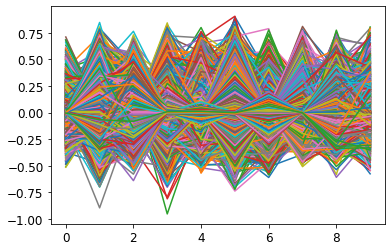

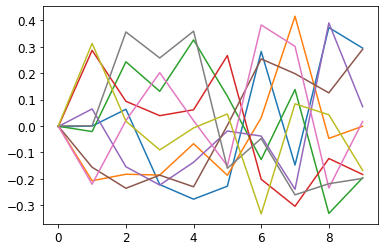

In [ ]:
n_paa_segments = 10
paa = PiecewiseAggregateApproximation(n_segments=n_paa_segments)
X_paa = paa.fit_transform(X_train_64)

plt.plot(X_paa.reshape(X_paa.shape[1], X_paa.shape[0]))
plt.show()

km = TimeSeriesKMeans(n_clusters=9, metric="euclidean", max_iter=5, random_state=0)
km.fit(X_paa)

plt.plot(km.cluster_centers_.reshape(X_paa.shape[1], 9))
plt.show()

In [ ]:
dict_dfs['gyro_y'].values[:-1,:-2].shape

(7352, 64)

In [ ]:
clf = KNeighborsClassifier(p=2, weights= 'distance')#metric='dtw_sakoechiba'
clf.fit(dict_dfs['gyro_y'].values[:-1,:-2], y_train.values)

y_pred = clf.predict(dict_dfs_test['gyro_y'].values[:-1,:-2])

print(classification_report(y_test.values, y_pred))

              precision    recall  f1-score   support

           1       0.69      0.71      0.70       496
           2       0.69      0.59      0.63       471
           3       0.59      0.27      0.37       420
           4       0.27      0.33      0.30       491
           5       0.29      0.35      0.32       532
           6       0.37      0.41      0.39       537

    accuracy                           0.45      2947
   macro avg       0.48      0.44      0.45      2947
weighted avg       0.47      0.45      0.45      2947



In [ ]:
import seaborn as sns

<AxesSubplot:>

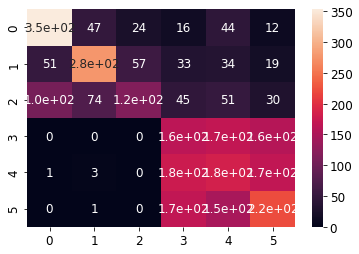

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot = True, fmt='.2g')

In [ ]:
confusion_matrix(y_test, y_pred)

array([[353,  47,  24,  16,  44,  12],
       [ 51, 277,  57,  33,  34,  19],
       [105,  74, 115,  45,  51,  30],
       [  0,   0,   0, 164, 169, 158],
       [  1,   3,   0, 177, 184, 167],
       [  0,   1,   0, 167, 147, 222]], dtype=int64)

In [ ]:
clf = KNeighborsClassifier(n_neighbors=100, p=2, n_jobs=-1)#metric='dtw_sakoechiba'
clf.fit(body_x.values, y_train.values)

y_pred = clf.predict(body_x_test.values)

print(classification_report(y_test.values, y_pred))

              precision    recall  f1-score   support

           1       0.47      0.76      0.58       496
           2       0.57      0.46      0.51       471
           3       1.00      0.10      0.18       420
           4       0.30      0.17      0.22       491
           5       0.39      0.75      0.51       532
           6       0.66      0.49      0.56       537

    accuracy                           0.47      2947
   macro avg       0.56      0.46      0.43      2947
weighted avg       0.55      0.47      0.44      2947



In [ ]:
clf = KNeighborsClassifier(n_neighbors=3, metric='dtw_sakoechiba', metric_params = {'window_size':0.01},  n_jobs=-1)#metric='dtw_sakoechiba'
clf.fit(body_x.values, y_train.values)

y_pred = clf.predict(body_x_test.values)

print(classification_report(y_test.values, y_pred))

              precision    recall  f1-score   support

           1       0.83      0.98      0.90       496
           2       0.74      0.80      0.77       471
           3       0.96      0.66      0.78       420
           4       0.38      0.47      0.42       491
           5       0.45      0.48      0.46       532
           6       0.72      0.51      0.60       537

    accuracy                           0.64      2947
   macro avg       0.68      0.65      0.65      2947
weighted avg       0.67      0.64      0.65      2947



In [ ]:
dict_dfs['body_x']

,0,1,2,3,4,5,6,7,8,9,...,56,57,58,59,60,61,62,63,subject,activity
0,0.000181,0.010139,0.009276,0.005066,0.010810,0.004045,0.004757,0.006214,0.003307,0.007572,...,0.003447,0.004378,0.005006,0.001997,-0.000472,-0.000756,-0.001528,-0.002391,1,STANDING
1,0.001094,0.004550,0.002879,0.002247,0.003305,0.002416,0.001619,0.000981,0.000009,-0.000363,...,0.000060,0.000435,-0.000819,0.000228,-0.000300,-0.001147,-0.000222,0.001576,1,STANDING
2,0.003531,0.002285,-0.000420,-0.003738,-0.006706,-0.003148,0.000733,0.000668,0.002162,-0.000946,...,0.001333,0.001541,0.001077,-0.000736,-0.003767,-0.004646,-0.002941,-0.001599,1,STANDING
3,-0.001772,-0.001311,0.000388,0.000408,-0.000355,0.000998,0.001109,-0.003149,-0.008882,-0.010483,...,-0.000268,-0.000394,-0.000279,-0.000316,0.000144,0.001246,0.003117,0.002178,1,STANDING
4,0.000087,-0.000272,0.001022,0.003126,0.002284,0.000885,0.001933,0.002270,0.002247,0.002175,...,0.001358,0.000820,-0.000212,-0.001915,-0.001631,-0.000867,-0.001172,-0.000028,1,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7348,0.711864,0.709237,0.321368,-0.028921,-0.208107,-0.192802,-0.066754,-0.042285,0.058089,0.106855,...,-0.227710,-0.210942,-0.179295,-0.142085,-0.131831,-0.154000,-0.176886,-0.211068,30,WALKING_UPSTAIRS
7349,-0.226717,-0.177817,-0.150869,-0.132237,-0.068338,0.007874,0.096481,0.205834,0.441342,0.662930,...,-0.274100,-0.326159,-0.379539,-0.382544,-0.371156,-0.295357,-0.203831,-0.124548,30,WALKING_UPSTAIRS
7350,-0.064806,-0.079933,-0.068350,-0.038477,-0.028679,0.018335,0.077571,0.253580,0.507805,0.583999,...,-0.313892,-0.367070,-0.395135,-0.347338,-0.319902,-0.294935,-0.243403,-0.215215,30,WALKING_UPSTAIRS
7351,-0.194471,-0.173802,-0.127545,-0.108369,-0.121152,-0.074004,-0.002135,0.177865,0.516936,0.701378,...,-0.396854,-0.413906,-0.379085,-0.356609,-0.317618,-0.315016,-0.330737,-0.272348,30,WALKING_UPSTAIRS


In [ ]:
clf = KNeighborsClassifier(metric='dtw_sakoechiba', n_jobs = -1)
clf.fit(body_x.values, y_train.values)

y_pred = clf.predict(body_x_test.values)

print(classification_report(y_test.values, y_pred))

In [ ]:
y_train_ts = np.array(dict_dfs_ts['activity'], dtype=object)
y_test_ts = np.array(dict_dfs_ts_test['activity'], dtype=object)
X_train_ts = np.array(dict_dfs_ts['body_x'], dtype=object)
X_test_ts = np.array(dict_dfs_ts_test['body_x'], dtype=object)

In [ ]:
clf = KNeighborsClassifier(n_neighbors=100, p=2, n_jobs=-1)#metric='dtw_sakoechiba'
clf.fit(X_train_ts, y_train_ts)

y_pred = clf.predict(X_test_ts)

print(classification_report(y_test_ts, y_pred))